In [226]:
import pandas as pd
import geopandas as gpd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math 
import plotly.express as px
from shapely import wkt
import pyodbc
from sqlalchemy import create_engine, URL, inspect

In [241]:
SERVER = 'localhost'  # localhost innebär att du ansluter till en server på din egen dator
DATABASE = 'AdventureWorks2022'

connection_string = f'DRIVER={{ODBC Driver 18 for SQL Server}};SERVER={SERVER};DATABASE={DATABASE};Trusted_Connection=yes;Encrypt=no'

connection_url = URL.create('mssql+pyodbc', query={'odbc_connect': connection_string})

engine = create_engine(connection_url)  # engine är anslutningsobjektet vi använder för att kommunicera med databasen.

#  **Teoretiska  Frågor**


1. Beskriv kort hur en relationsdatabas fungerar.
   I relationsdatabaser används tabeller med data ordnade i rader och kolumner ,Varje rad innehåller en unik identifierare eller nyckel som kopplar samman tabeller,relationsdatabas används nyckeln för att hitta relaterade data mellan datamängder.

2. Vad menas med “CRUD”-flödet?
   CRUD står för Create, Read, Update och Delete. Dessa är de fyra grundläggande operationerna som kan utföras på data i en databas.

3. Beskriv kort vad en “left join” och en “inner join” är. Varför använder man det?
   LEFT JOIN används för att hämta alla rader från den vänstra tabellen och de matchade raderna från den högra tabellen.
   INNER JOIN används för att hämta endast de rader där det finns en matchning i båda tabellerna baserat på det angivna kopplingsvillkoret.

4. Beskriv kort vad indexering i SQL innebär.
   Index är en speciell tabell som gör att en vanlig tabell kan genomsökas snabbare ,Indexering kan öka sökhastigheten betydligt. En nackdel med indexen är dock att varje infogning, uppdatering eller borttagning kräver att indexen uppdateras.

5. Beskriv kort vad en vy i SQL är.
   En vy är en virtuell tabell vars innehåll baseras på resultatet från en SQL-fråga
   Data i den vyn kan komma från en eller flera tabeller eller från andra vyer i en eller flera databaser.
   Det finns många sätt att använda till exempel Vyer kan användas som säkerhetsmekanismer genom att låta användare komma åt data via vyn, utan att ge användarna behörighet att direkt komma åt de underliggande tabellerna i frågan.

6. Beskriv kort vad en lagrad procedur i SQL är.
   En lagrad procedur är en förberedd SQL-kod som kan sparas så att koden kan återanvändas om och om igen ,du anropar med 'CALL' nyckelordet. De kan acceptera parametrar och ge tillbaka output,de används för att utföra vanliga databasoperationer, databehandling och automatisering av komplexa uppgifter.
   De kan förbättra databassäkerhet och kodåteranvändbarhet.


## 1.  Programmering och analys

AdventureWorks2022 databasen är ett exempel på relationsdatabas designad av Microsoft modellerar ett fiktivt företag, Adventure Works Cycles, som tillverkar och säljer cyklar och relaterade produkter.
Databasen är uppdelad i flera scheman, var och en grupperar tabeller relaterade till en specifik domän, till exempel:

1. Sales Schema : Innehåller data relaterad till försäljningstransaktioner, kunder och butiker.
   Key tables   :Sales.SalesOrderHeader ,Sales.SalesOrderDetail ,Sales.Customer.

2. Production Schema : Inkluderar data om produktlager, tillverkningsprocesser och produktdetaljer.

3. Person schema :Lagrar information om anställda, affärskontakter och adresser.

4. HumanResources Schema :Inkluderar data om anställda, avdelningar och jobbroller.

In [10]:
# Number of tables in each schema 
Table_Schema_Count_query = """SELECT TABLE_SCHEMA,COUNT(*) AS TableCount
FROM INFORMATION_SCHEMA.TABLES
WHERE TABLE_TYPE = 'BASE TABLE'
GROUP BY TABLE_SCHEMA
ORDER BY TableCount DESC;"""
Table_Schema_Count_df = pd.read_sql(Table_Schema_Count_query, engine)
Table_Schema_Count_df



,TABLE_SCHEMA,TableCount
0,Production,25
1,Sales,19
2,Person,13
3,HumanResources,6
4,Purchasing,5
5,dbo,4


## 2. Sales Performance Analysis

In [ ]:
#Comparison of Online and In-Store Sales Performance Identifying which sales channel performs better overall
Sales_comparison_by_year_query = """SELECT 
YEAR(OrderDate) AS OrderYear ,
CASE WHEN OnlineOrderFlag = 1 THEN 'Online'
ELSE 'IN-Store'
END AS SalesChannel,COUNT(SalesOrderID) AS NumberOfOrders,
SUM(TotalDue) AS TotalSales,
AVG(TotalDue) AS AverageOrderValue
FROM Sales.SalesOrderHeader 
GROUP BY YEAR(OrderDate),OnlineOrderFlag
ORDER BY OrderYear,SalesChannel;"""
Sales_comparison_by_year_df = pd.read_sql(Sales_comparison_by_year_query ,engine)
Sales_comparison_by_year_df

,OrderYear,SalesChannel,NumberOfOrders,TotalSales,AverageOrderValue
0,2011,IN-Store,406,9.886952e+06,24352.0975
1,2011,Online,1201,4.268748e+06,3554.3279
2,2012,IN-Store,1172,3.061409e+07,26121.2348
3,2012,Online,2743,7.061613e+06,2574.4123
4,2013,IN-Store,1598,3.710689e+07,23220.8303
5,2013,Online,12584,1.185900e+07,942.3872
6,2014,IN-Store,630,1.316752e+07,20900.8272
7,2014,Online,11131,9.251977e+06,831.1901


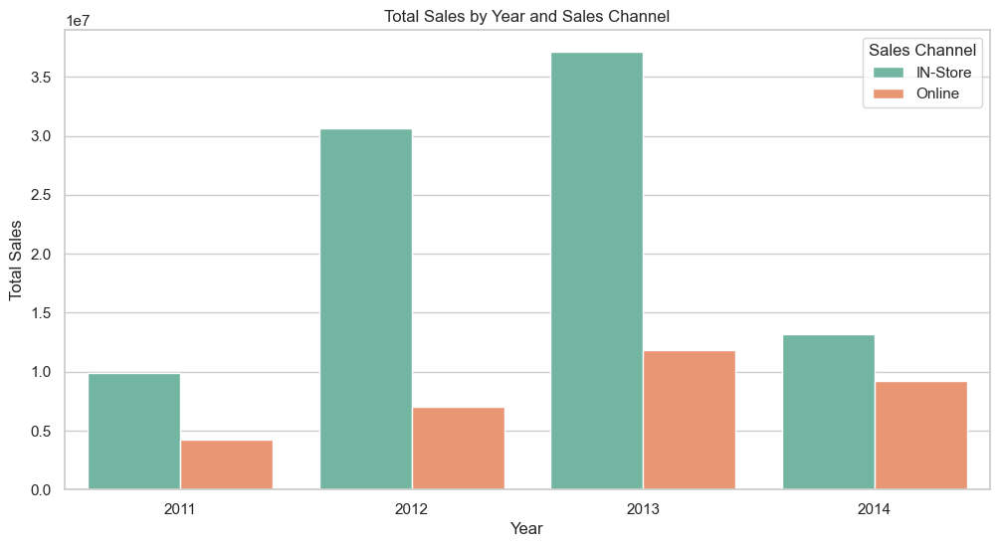

In [206]:
plt.figure(figsize=(12, 6))
sns.barplot(data=Sales_comparison_by_year_df, x='OrderYear', y='TotalSales',hue='SalesChannel',palette='Set2')
plt.title('Total Sales by Year and Sales Channel')
plt.xlabel('Year')
plt.ylabel('Total Sales')
plt.legend(title='Sales Channel')

plt.show()

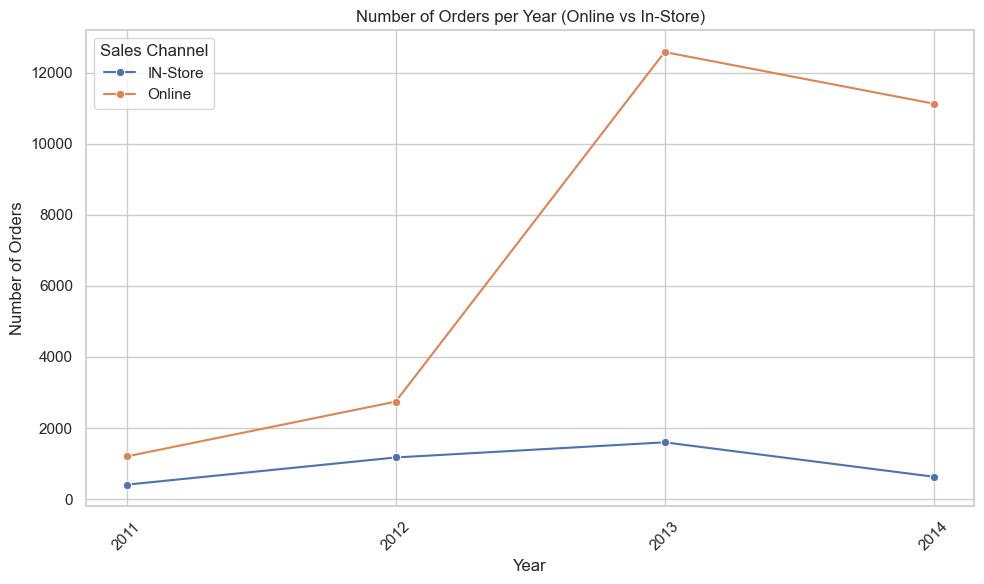

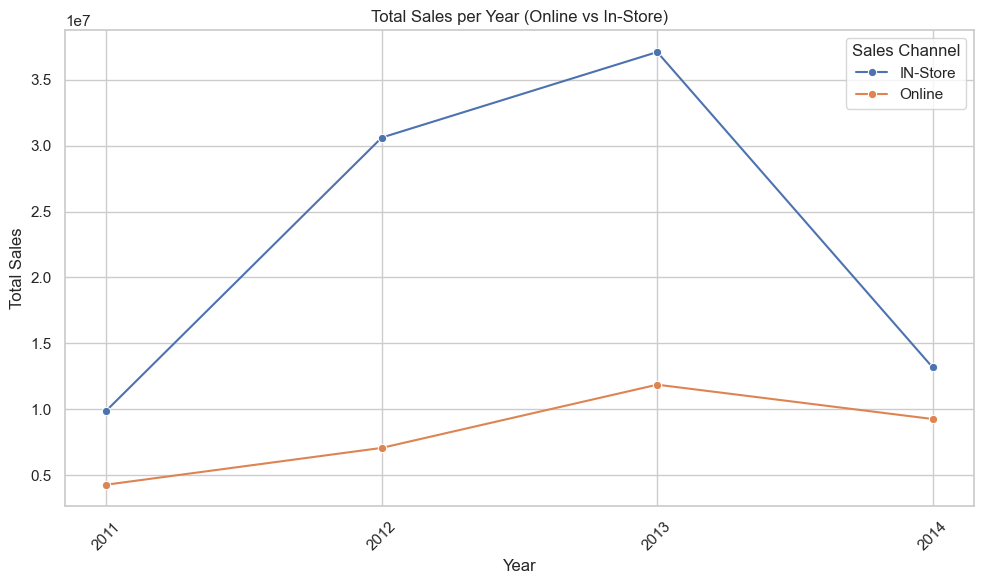

In [ ]:
# comparing number of orders and total sales per year in both sales channels
Sales_comparison_by_year_df['OrderYear'] = Sales_comparison_by_year_df['OrderYear'].astype(str)

sns.set(style="whitegrid")

#Chart for Number of Orders
plt.figure(figsize=(10, 6))
sns.lineplot(data=Sales_comparison_by_year_df, x='OrderYear', y='NumberOfOrders', hue='SalesChannel', marker='o')
plt.title('Number of Orders per Year (Online vs In-Store)')
plt.xlabel('Year')
plt.ylabel('Number of Orders')
plt.xticks(rotation=45)
plt.legend(title='Sales Channel')
plt.tight_layout()
plt.show()

#Chart for Total Sales
plt.figure(figsize=(10, 6))
sns.lineplot(data=Sales_comparison_by_year_df, x='OrderYear', y='TotalSales', hue='SalesChannel', marker='o')
plt.title('Total Sales per Year (Online vs In-Store)')
plt.xlabel('Year')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.legend(title='Sales Channel')
plt.tight_layout()
plt.show()


In [ ]:
#as we can see in the plot that the numbers of online orders are higher than in store but the sales amount is still higher in store 
#which means that we have a lot of online orders with low value compared with low order volume in store with higher value
#this query shows the peak in 2013 with higher number of online orders but yet in store value is a lot higher 
Sales_comparison_by_year = """SELECT 
CASE WHEN OnlineOrderFlag = 1 THEN 'Online'
ELSE 'IN-Store'
END AS SalesChannel,
COUNT(SalesOrderID) AS NumberOfOrders,
SUM(TotalDue) AS TotalSales
FROM Sales.SalesOrderHeader 
WHERE YEAR(OrderDate) = 2013
GROUP BY OnlineOrderFlag
ORDER BY OnlineOrderFlag;"""
Sales_comparison_year_2013_df = pd.read_sql(Sales_comparison_by_year ,engine)
Sales_comparison_year_2013_df

,SalesChannel,NumberOfOrders,TotalSales
0,IN-Store,1598,3.710689e+07
1,Online,12584,1.185900e+07


In [ ]:
#most profit per product for both sales channels 
Profit_PER_Product = """SELECT
CASE
    WHEN soh.OnlineOrderFlag = 1 THEN 'Online'
    ELSE 'In-Store'
    END AS SalesChannel,
    p.Name AS ProductName,
    COUNT(sod.SalesOrderDetailID) AS QuantitySold,
    SUM(sod.LineTotal) AS TotalSales,
    SUM((sod.UnitPrice - sod.UnitPriceDiscount) * sod.OrderQty - (p.StandardCost * sod.OrderQty)) AS TotalProfit,
    AVG((sod.unitPrice - sod.UnitPriceDiscount) - p.StandardCost) AS ProfitPerUnit,
	AVG(sod.UnitPrice) AS AverageSellingPrice,
    AVG(p.StandardCost) AS AverageCostPrice
FROM
    Sales.SalesOrderHeader AS soh
JOIN
    Sales.SalesOrderDetail AS sod ON soh.SalesOrderID = sod.SalesOrderID
JOIN
    Production.Product AS p ON sod.ProductID = p.ProductID
GROUP BY
    CASE WHEN soh.OnlineOrderFlag = 1 THEN 'Online' ELSE 'In-Store' END,
    p.Name
ORDER BY
    SalesChannel,
    TotalProfit DESC;"""
Profit_PER_Product_df =pd.read_sql(Profit_PER_Product,engine)
Profit_PER_Product_df
#AS we can see the most profitable item in store is "Mountain-200 Black,38" 
#the most profitable item online is "Mountain-100 Silver, 42"
    

,SalesChannel,ProductName,QuantitySold,TotalSales,TotalProfit,ProfitPerUnit,AverageSellingPrice,AverageCostPrice
0,In-Store,"Mountain-200 Black, 38",670,3.105727e+06,112785.5515,48.4358,1300.4176,1251.9813
1,In-Store,"Mountain-200 Black, 42",563,2.646353e+06,84360.3615,40.3564,1292.3382,1251.9813
2,In-Store,"Mountain-200 Silver, 38",498,2.354215e+06,81437.6612,42.0099,1307.6298,1265.6195
3,In-Store,Hitch Rack - 4-Bike,468,1.977362e+05,72672.2700,26.5796,71.4641,44.8800
4,In-Store,"Mountain-200 Black, 46",439,1.936204e+06,70923.6520,48.8961,1300.8776,1251.9813
...,...,...,...,...,...,...,...,...
375,Online,Patch Kit/8 Patches,3191,7.307390e+03,4574.2985,1.4335,2.2900,0.8565
376,Online,AWC Logo Cap,2190,1.968810e+04,4528.2630,2.0677,8.9900,6.9223
377,Online,Bike Wash - Dissolver,908,7.218600e+03,4518.8436,4.9767,7.9500,2.9733
378,Online,"Racing Socks, M",298,2.679020e+03,1677.0546,5.6277,8.9900,3.3623


In [ ]:
# 10 Most Popular products 
top_10 =Profit_PER_Product_df.sort_values(
    by = ["QuantitySold"],ascending = False).head(10)
fig =px.bar(top_10, x ='ProductName',y = 'QuantitySold',
            title='Top 10 Most Sold Products',
            labels={'ProductName':'Produc tName','QuantitySold':'Quantity Sold'})

fig.show()

In [ ]:
#confidence interval for average orders per custommer in both sales channels  
#AS we are egoing to see that there is a significant difference between the two channels, Customers Tend to make far fewer orders online
#Close to one order per customer compared to in store around 5 orders per custommer 

query_interval = """
SELECT
    OrderChannel,
    AVG(TotalOrders) AS AvgOrdersPerCustomer,
    STDEV(TotalOrders) AS StdDevOrdersPerCustomer,
    COUNT(CustomerID) AS NumCustomers
FROM (SELECT c.CustomerID, COUNT(s.SalesOrderID) AS TotalOrders,
    CASE WHEN s.OnlineOrderFlag = 1 THEN 'Online' ELSE 'In-Store'
    END AS OrderChannel
    FROM Sales.SalesOrderHeader AS s
    JOIN Sales.Customer AS c ON s.CustomerID = c.CustomerID
    GROUP BY c.CustomerID, s.OnlineOrderFlag) AS OrdersPerCustomer
    GROUP BY OrderChannel; """
    
df_interval = pd.read_sql(query_interval, engine)
# Function to Calculate the Confidence Intervals
def calculate_ci(mean, std_dev, n, z=1.96):
    margin_of_error = z * (std_dev / math.sqrt(n))
    return (mean - margin_of_error, mean + margin_of_error)

online_mean = df_interval.loc[df_interval['OrderChannel'] == 'Online', 'AvgOrdersPerCustomer'].values[0]
online_std = df_interval.loc[df_interval['OrderChannel'] == 'Online', 'StdDevOrdersPerCustomer'].values[0]
online_n = df_interval.loc[df_interval['OrderChannel'] == 'Online', 'NumCustomers'].values[0]

instore_mean = df_interval.loc[df_interval['OrderChannel'] == 'In-Store', 'AvgOrdersPerCustomer'].values[0]
instore_std = df_interval.loc[df_interval['OrderChannel'] == 'In-Store', 'StdDevOrdersPerCustomer'].values[0]
instore_n = df_interval.loc[df_interval['OrderChannel'] == 'In-Store', 'NumCustomers'].values[0]

ci_online = calculate_ci(online_mean, online_std, online_n)
ci_instore = calculate_ci(instore_mean, instore_std, instore_n)



print("Confidence Interval (Online):", ci_online)
print("Confidence Interval (In-Store):", ci_instore)

Confidence Interval (Online): (0.9841254974725456, 1.0158745025274545)
Confidence Interval (In-Store): (4.765558294779228, 5.234441705220772)


In [201]:
online_data = pd.read_sql("""
SELECT c.CustomerID, COUNT(s.SalesOrderID) AS TotalOrders
FROM Sales.SalesOrderHeader AS s
JOIN Sales.Customer AS c ON s.CustomerID = c.CustomerID
WHERE s.OnlineOrderFlag = 1
GROUP BY c.CustomerID;
""", engine)

instore_data = pd.read_sql("""
SELECT c.CustomerID, COUNT(s.SalesOrderID) AS TotalOrders
FROM Sales.SalesOrderHeader AS s
JOIN Sales.Customer AS c ON s.CustomerID = c.CustomerID
WHERE s.OnlineOrderFlag = 0
GROUP BY c.CustomerID;
""", engine)

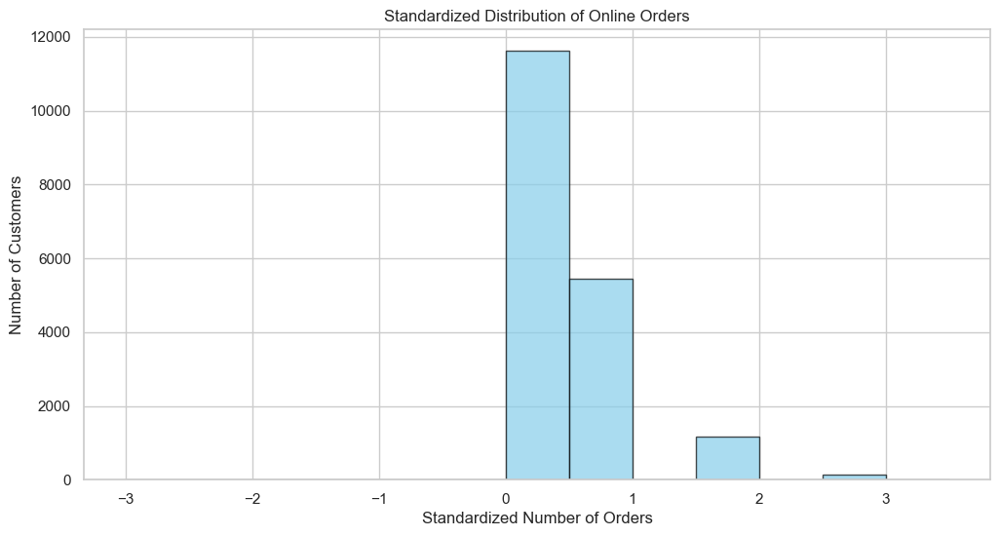

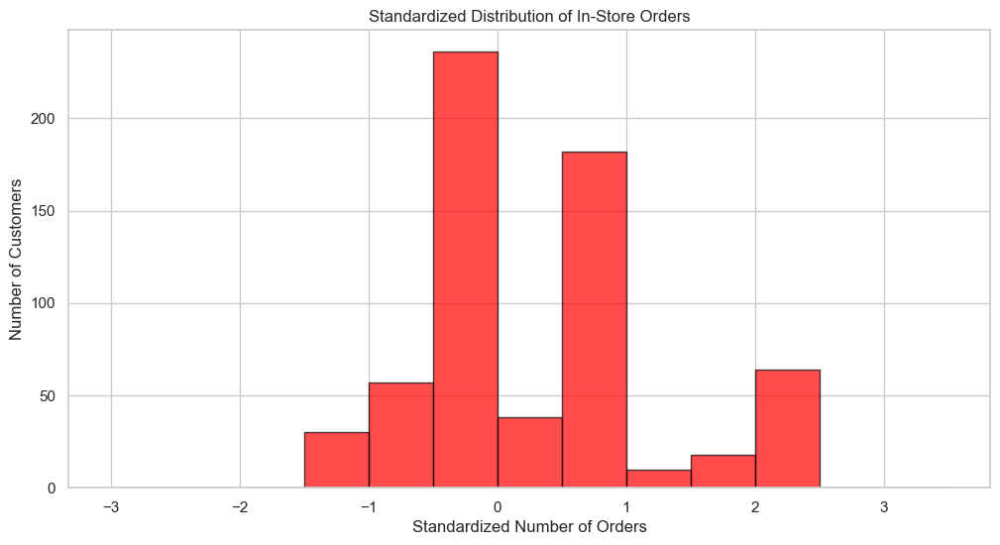

In [208]:
#online
online_data['ZScore'] = (online_data['TotalOrders'] - online_mean) / online_std
instore_data['ZScore'] = (instore_data['TotalOrders'] - instore_mean) / instore_std
plt.figure(figsize=(12, 6))
plt.hist(online_data['ZScore'],bins=np.arange(-3, 4, 0.5),alpha=0.7,color="skyblue",edgecolor="black",)
plt.xlabel("Standardized Number of Orders")
plt.ylabel("Number of Customers")
plt.title("Standardized Distribution of Online Orders")
plt.show()

#in_store
plt.figure(figsize=(12, 6))
plt.hist(instore_data['ZScore'],bins=np.arange(-3, 4, 0.5),alpha=0.7,color="red",edgecolor="black",)
plt.xlabel("Standardized Number of Orders")
plt.ylabel("Number of Customers")
plt.title("Standardized Distribution of In-Store Orders")
plt.show()

In [ ]:
#segmenting customers into three spending categories
Spendin_per_costumer = """ WITH CustomerSpending AS
(SELECT soh.CustomerID ,SUM(sod.LineTotal) AS TotalSpending
FROM Sales.SalesOrderHeader as soh
JOIN Sales.SalesOrderDetail as sod
ON soh.SalesOrderID = sod.SalesOrderID
GROUP BY soh.CustomerID),

AvgSpending AS
(SELECT AVG(Totalspending) AS AvgSpending,
STDEV(TotalSpending) AS StdevSpending
FROM CustomerSpending)

SELECT cs.CustomerID,cs.TotalSpending,
CASE 
WHEN cs.TotalSpending < 100.000000 THEN 'Low Spender'
WHEN cs.TotalSpending > (av.AvgSpending + av.StdevSpending) THEN 'High Spender'
WHEN cs.TotalSpending  BETWEEN  (av.AvgSpending - av.StdevSpending) AND (av.AvgSpending + av.StdevSpending) THEN 'Medium Spender'
ELSE 'Low Spender'

END AS SpendingCategory,a.City,sp.name AS StateProvince,cr.name AS CountryRegion,a.SpatialLocation.STAsText() Location
FROM CustomerSpending AS cs
CROSS JOIN AvgSpending AS av 
JOIN
Sales.SalesOrderHeader AS soh
ON cs.CustomerID = soh.CustomerID
JOIN
Person.Address as a
ON soh.BillToAddressID = a.addressID
JOIN
Person.StateProvince AS sp
ON a.StateProvinceID = sp.StateProvinceID
JOIN
Person.CountryRegion AS cr
ON sp.CountryRegionCode = cr.CountryRegionCode;"""




In [235]:
#geographic plot for customers based on their spending 
Spendin_per_costumer_Location_df = pd.read_sql(Spendin_per_costumer, engine)
Spendin_per_costumer_Location_df['Location'] = Spendin_per_costumer_Location_df.Location.apply(wkt.loads)
gdf = gpd.GeoDataFrame(Spendin_per_costumer_Location_df)
gdf = gdf.set_geometry('Location')
gdf = gdf.set_crs(epsg=4326)

fig = px.scatter_mapbox(gdf, lat=gdf.geometry.y, lon=gdf.geometry.x, zoom=1, opacity=.75, color='SpendingCategory', title='Customers Location',
color_discrete_map = {'High Spender': 'green','Medium Spender':'orange','Low Spender':'red'})
fig.update_layout(mapbox_style='carto-darkmatter', height=750)
fig.show()

In [91]:
print(gdf['SpendingCategory'].value_counts())

SpendingCategory
Medium Spender    20539
Low Spender        8600
High Spender       2326
Name: count, dtype: int64


In [239]:
#Which geographic regions generate the most sale
Most_Sales_Per_Region = """
SELECT
    SalesTerritory.[Group] AS GeographicRegion,
    ROUND(SUM(SalesOrderHeader.TotalDue), 2) AS TotalSales
FROM Sales.SalesOrderHeader AS SalesOrderHeader
INNER JOIN Sales.Customer AS Customer
    ON SalesOrderHeader.CustomerID = Customer.CustomerID
INNER JOIN Sales.SalesTerritory AS SalesTerritory
    ON SalesOrderHeader.TerritoryID = SalesTerritory.TerritoryID
GROUP BY SalesTerritory.[Group]
ORDER BY TotalSales DESC;"""

Most_Sales_Per_Region_df = pd.read_sql(Most_Sales_Per_Region,engine)
fig = px.pie(Most_Sales_Per_Region_df,names = 'GeographicRegion',values = 'TotalSales',
             title= 'Total Sales by Geoagraphic Region')
fig.show()

In [ ]:
#categorasing spending per state for us customers showing the spending status for each state 
state_spending = Spendin_per_costumer_Location_df.groupby(['StateProvince', 'SpendingCategory']).size().reset_index(name='Count')
#SpendingCategory as columns
state_spending_pivot = state_spending.pivot_table(index='StateProvince', columns='SpendingCategory', values='Count', aggfunc='sum', fill_value=0)
#dominant spending category
state_spending_pivot['DominantSpendingCategory'] = state_spending_pivot.idxmax(axis=1)


In [240]:
state_spending_pivot['SpendingCategoryNumeric'] = state_spending_pivot['DominantSpendingCategory'].map({
    'High Spender': 2,
    'Medium Spender': 1,
    'Low Spender': 0 })
gdf = gpd.read_file(r'C:\Users\alikh\Desktop\us_msp\cb_2021_us_state_500k\cb_2021_us_state_500k.shp')
gdf = gdf.merge(state_spending_pivot, left_on='NAME', right_on='StateProvince')

fig = px.choropleth(gdf,
                    geojson=gdf.geometry,
                    locations=gdf.index,
                    color='SpendingCategoryNumeric',
                    hover_name='NAME',
                    hover_data={'SpendingCategoryNumeric': True, 'DominantSpendingCategory': True},
                    color_continuous_scale="Turbo",
                    title='Spending Categories by State')
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(height=800)
fig.show()


## 3. Resultaten av analysen

• Sales Comparison:

Total in-store sales significantly exceeded online sales, with a peak in 2013. Although online orders were more frequent, their lower average order value contributed to the difference in total revenue.

• Customer Behavior:

Customer behavior differs notably between the two channels. On average, customers placed far fewer orders online (close to one order per customer) compared to in-store (around five orders per customer). From a total of approximately 30,000 customers, we identified 2,326 high spenders, 20,539 medium spenders, and 8,600 low spenders.

• Best-Selling Products:

Certain products performed consistently well across both sales channels, while others were more successful in one channel over the other.

• Geographic Trends:

Online sales demonstrated a broader geographic reach, while in-store sales were concentrated in high-spending regions. The U.S. remains the market with the highest revenue overall.




## Recommendations


• Optimize Online Sales Strategy: Invest in digital marketing to reach a wider audience and increase customer acquisition. Implement upselling and cross-selling strategies to boost order size.

• Customer Engagement: Create targeted campaigns for high spenders, such as loyalty programs or exclusive discounts. For in-store sales, introduce exclusive promotions to drive foot traffic.

• Product Strategy: Focus on promoting top-selling products and bundle complementary items to increase overall sales.

• Geographic Focus: Invest in high-performing regions and consider scaling back operations in underperforming 


## 4. Executive Summary



AdventureWorks demonstrates strong performance in both sales channels, with in-store sales generating higher total revenue due to larger order values, despite online orders being more frequent. Online sales show significant potential for growth with a broader geographic reach, while in-store sales excel in high-spending regions, particularly in the U.S., which remains the top-performing market. Customer behavior analysis revealed that online customers average only one order each, compared to five orders in-store. Additionally, a small but crucial segment of high spenders (2,326 customers) drives a disproportionate share of revenue. Best-selling products perform consistently across channels, with some excelling in specific categories.



To capitalize on these insights, the company should invest in digital marketing to expand online sales, implement loyalty programs to retain high spenders, and use upselling and bundling strategies to increase order values. Regionally, resources should focus on high-performing markets while scaling back in underperforming areas. By optimizing both channels and tailoring strategies to customer behavior and geographic trends, AdventureWorks can drive sustained growth and profitability.



## 5. Datum för muntlig presentation

Fredag 2025/1/03 kl: 14:30

## Självvärdering

### 1.Utmaningar under arbetet

Det var svårt all balensera tiden mellan olika delar av projrktet men det gick bättre när jag delade upp arbetet i mindre delar med deadlines, i tekniska delen svårigheter var genom att få vissa funktioner och queries att fungera men det gick när jag sökte online och kollade många kurser i datacamp 

### 2.Vilket betyg anser jag att jag ska ha

Jag tycker att jag är nöjd med mitt arbette och ser fram emot VG

### 3.Tips till mig själv

Jag skulle tipsa mig attt ha en plan från början och fokusera på 